In [2]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import rioxarray as rxr
import rasterio
import adlfs
import contextily as ctx
from tqdm import tqdm

In [3]:
from dask.distributed import Client, LocalCluster
cluster = LocalCluster(processes=False, n_workers=4, local_directory='/tmp')
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/egagli@uw.edu/proxy/8787/status,
Dashboard: /user/egagli@uw.edu/proxy/8787/status,Workers: 4
Total threads: 4,Total memory: 32.00 GiB
Status: running,Using processes: False
Comm: inproc://10.244.8.17/10192/1,Workers: 4
Dashboard: /user/egagli@uw.edu/proxy/8787/status,Total threads: 4
Started: Just now,Total memory: 32.00 GiB
Comm: inproc://10.244.8.17/10192/4,Total threads: 1
Dashboard: /user/egagli@uw.edu/proxy/33379/status,Memory: 8.00 GiB
Nanny: None,


In [4]:
# check out article michelle sent: https://agupubs.onlinelibrary.wiley.com/doi/epdf/10.1029/1999WR900090

In [5]:
gf = gpd.read_file('https://github.com/scottyhq/snotel/raw/main/snotel-sites.geojson')

In [6]:
snotel_gf = gf[gf.isActive==True]

In [7]:
snotel_ts_gf = pd.read_pickle('../../snotel/SNOTEL-WTEQ_D.pkl')

In [8]:
snotel_ts_gf = snotel_ts_gf.loc[slice(f'1950-01-01',f'2022-12-31')]

In [9]:
snotel_ts_gf = snotel_ts_gf[(snotel_ts_gf.index.month>1)&(snotel_ts_gf.index.month<10)]

In [10]:
snotel_doy_max_swe = snotel_ts_gf.groupby(snotel_ts_gf.index.year).idxmax()
snotel_max_swe = snotel_ts_gf.groupby(snotel_ts_gf.index.year).max()

In [11]:
max_swe_years = [f'max_swe_{year}' for year in snotel_doy_max_swe.index.values]
doy_max_swe_years = [f'doy_max_swe_{year}' for year in snotel_max_swe.index.values]

In [12]:
snotel_gf = pd.concat([snotel_gf,pd.DataFrame(columns = max_swe_years)])
snotel_gf = pd.concat([snotel_gf,pd.DataFrame(columns = doy_max_swe_years)])

In [13]:
for i,row in snotel_gf.iterrows():
    try:
        row_dates = snotel_doy_max_swe[f'SNOTEL:{row.code}']
        row_dates = row_dates[row_dates.notna()]
        
        row_values = snotel_max_swe[f'SNOTEL:{row.code}']
        row_values = row_values[row_values.notna()]
        
        for year in [date for date in row_dates.index]:
            snotel_gf.loc[i,f'doy_max_swe_{year}'] = int(row_dates.dt.dayofyear[year])
            snotel_gf.loc[i,f'max_swe_{year}'] = row_values[year]
    except:
        pass

In [14]:
snotel_gf['median_doy_max_swe'] = snotel_gf[snotel_gf.columns[pd.Series(snotel_gf.columns).str.startswith('doy_max_swe')]].median(axis=1)
snotel_gf['mean_doy_max_swe'] = snotel_gf[snotel_gf.columns[pd.Series(snotel_gf.columns).str.startswith('doy_max_swe')]].mean(axis=1)
snotel_gf['std_doy_max_swe'] = snotel_gf[snotel_gf.columns[pd.Series(snotel_gf.columns).str.startswith('doy_max_swe')]].std(axis=1)

snotel_gf['median_max_swe'] = snotel_gf[snotel_gf.columns[pd.Series(snotel_gf.columns).str.startswith('max_swe')]].median(axis=1)
snotel_gf['mean_max_swe'] = snotel_gf[snotel_gf.columns[pd.Series(snotel_gf.columns).str.startswith('max_swe')]].mean(axis=1)
snotel_gf['std_max_swe'] = snotel_gf[snotel_gf.columns[pd.Series(snotel_gf.columns).str.startswith('max_swe')]].std(axis=1)

In [15]:
snotel_gf.sort_values('std_doy_max_swe')

,code,name,elevation_m,latitude,longitude,county,state,beginDate,endDate,HUC,...,doy_max_swe_2019,doy_max_swe_2020,doy_max_swe_2021,doy_max_swe_2022,median_doy_max_swe,mean_doy_max_swe,std_doy_max_swe,median_max_swe,mean_max_swe,std_max_swe
546,1124_CO_SNTL,Moon Pass,3395.471924,37.966610,-106.558372,Saguache,Colorado,2008-10-01 00:00:00,2100-01-01,130100040201,...,95,91,91,95,94.5,94.928571,7.620461,6.85,7.128571,2.048049
520,1207_NV_SNTL,Merritt Mountain,2105.558350,41.892799,-115.858200,Elko,Nevada,2011-12-23 08:00:00,2100-01-01,170501020601,...,NaN,NaN,160,171,165.5,165.500000,7.778175,0.00,0.000000,0.000000
404,549_NV_SNTL,Jacks Peak,2567.635254,41.513599,-116.011703,Elko,Nevada,1981-10-01 00:00:00,2100-01-01,170501050201,...,NaN,NaN,160,171,165.5,165.500000,7.778175,0.00,0.000000,0.000000
540,1287_MT_SNTL,Mom Creek,2682.239990,44.776649,-113.122452,Beaverhead,Montana,2017-10-13 00:00:00,2100-01-01,100200011202,...,107,108,117,124,112.5,114.000000,8.041559,15.30,14.525000,2.302716
800,955_AK_SNTL,Summit Creek,426.720001,60.617130,-149.531281,Kenai Peninsula,Alaska,1988-10-01 00:00:00,2100-01-01,190203020401,...,81,107,109,97,98.0,98.939394,8.781868,11.60,11.433333,3.138239
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
780,1203_NV_SNTL,Stag Mountain,2325.014404,41.408100,-115.446602,Elko,Nevada,2011-12-23 08:00:00,2100-01-01,170501020101,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
788,1157_WA_SNTL,Stickney Ridge,1161.287964,47.923401,-121.616699,Snohomish,Washington,2079-06-06 00:00:00,2100-01-01,171100090502,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
798,1095_AK_SNTL,Sugarloaf Mtn,167.639999,61.081001,-146.299500,Valdez-Cordova,Alaska,2006-10-01 00:00:00,2100-01-01,190202011101,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
826,1202_NV_SNTL,Tent Mtn Lower,2165.299316,40.978519,-115.172180,Elko,Nevada,2011-12-23 08:00:00,2100-01-01,160401010704,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
snotel_doy_max_swe_gf = snotel_gf[snotel_gf.columns[pd.Series(snotel_gf.columns).str.startswith('doy_max_swe')]].astype('float32')
snotel_max_swe_gf = snotel_gf[snotel_gf.columns[pd.Series(snotel_gf.columns).str.startswith('max_swe')]].astype('float32')

In [17]:
start_year = int(snotel_doy_max_swe_gf.columns[0][12:])
end_year = int(snotel_doy_max_swe_gf.columns[-1][12:])
years = list(range(start_year,end_year+1))

In [18]:
for i,row in snotel_gf.iterrows():
    try:
        idx_doy = np.isfinite(snotel_doy_max_swe_gf.loc[i])
        idx_swe = np.isfinite(snotel_max_swe_gf.loc[i])
        if idx_doy.sum() >= 30: # if site has more than a 30 year record
            snotel_gf.loc[i,f'doy_max_swe_trend'] =  np.polyfit(np.array(years)[idx_doy.values], snotel_doy_max_swe_gf.loc[i][idx_doy], 1)[0]
            snotel_gf.loc[i,f'max_swe_trend'] =  np.polyfit(np.array(years)[idx_swe.values], snotel_max_swe_gf.loc[i][idx_swe], 1)[0]
    except:
        pass

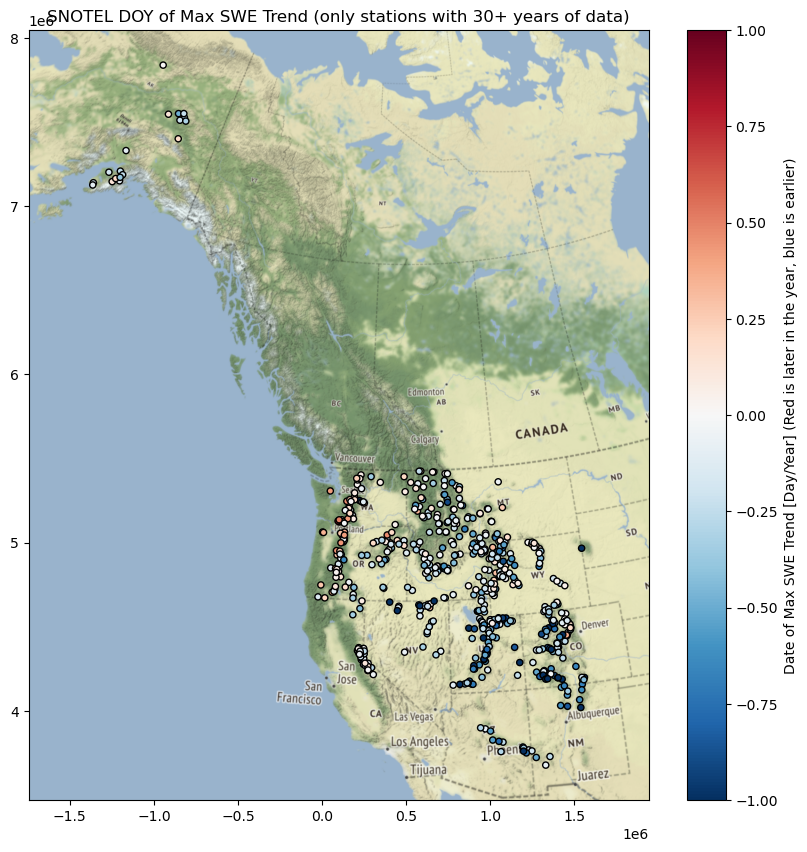

In [19]:
f,ax=plt.subplots(figsize=(10,10))
snotel_gf_projected =snotel_gf.to_crs('EPSG:32611')
snotel_gf_projected.plot(column='doy_max_swe_trend',ax=ax,legend=True,cmap='RdBu_r',edgecolor='k',markersize=20,vmin=-1,vmax=1,legend_kwds={'label':'Date of Max SWE Trend [Day/Year] (Red is later in the year, blue is earlier)'})
ax.axis('equal')
ax.set_title('SNOTEL DOY of Max SWE Trend (only stations with 30+ years of data)')
ctx.add_basemap(ax=ax, crs=snotel_gf_projected.crs, source=ctx.providers.Stamen.Terrain, attribution=False)

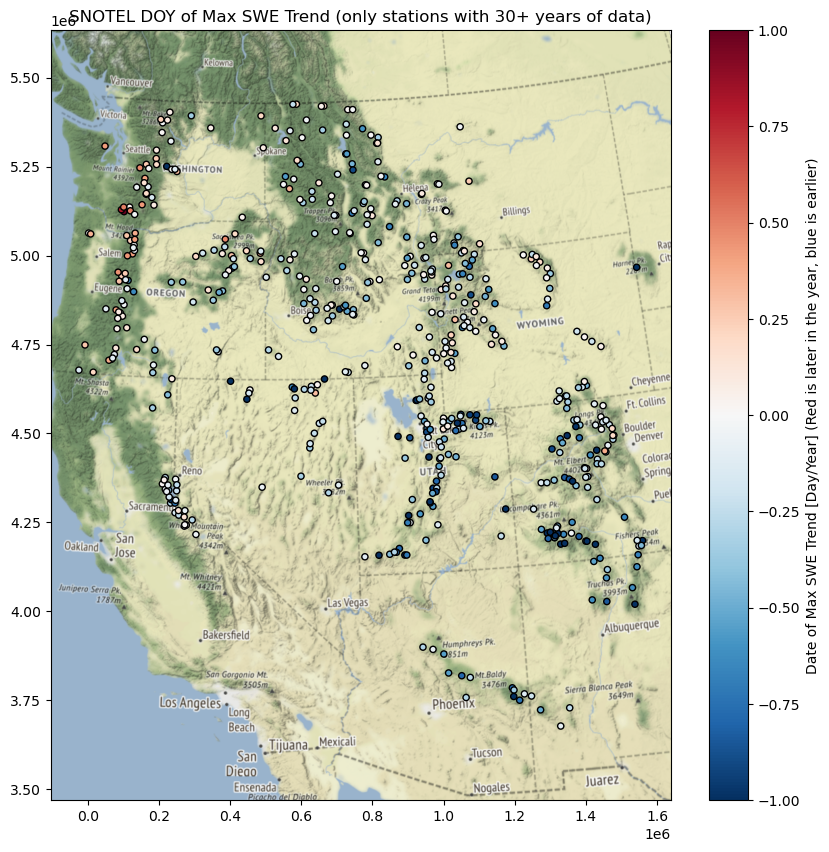

In [20]:
f,ax=plt.subplots(figsize=(10,10))
snotel_gf_projected[snotel_gf_projected.state!='Alaska'].plot(column='doy_max_swe_trend',ax=ax,legend=True,cmap='RdBu_r',edgecolor='k',markersize=20,vmin=-1,vmax=1,legend_kwds={'label':'Date of Max SWE Trend [Day/Year] (Red is later in the year, blue is earlier)'})
ax.axis('equal')
ax.set_title('SNOTEL DOY of Max SWE Trend (only stations with 30+ years of data)')
ctx.add_basemap(ax=ax, crs=snotel_gf_projected.crs, source=ctx.providers.Stamen.Terrain, attribution=False)

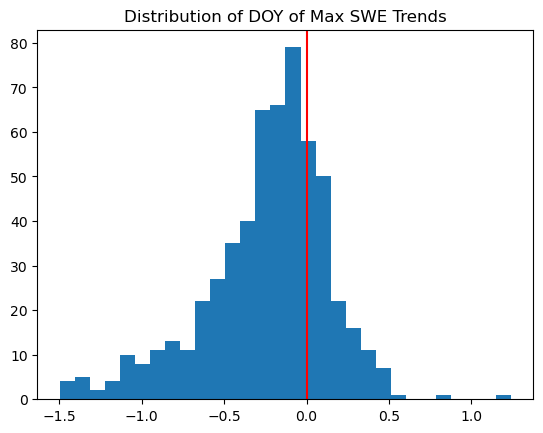

In [21]:
f,ax=plt.subplots()
ax.hist(snotel_gf_projected['doy_max_swe_trend'],bins=30)
ax.set_title('Distribution of DOY of Max SWE Trends')
ax.axvline(x=0,color='red')

In [22]:
snotel_gf_projected_trends = snotel_gf_projected.groupby('mountainRange').mean()['doy_max_swe_trend'][snotel_gf_projected.groupby('mountainRange')['doy_max_swe_trend'].count()>7]

<AxesSubplot:ylabel='mountainRange'>

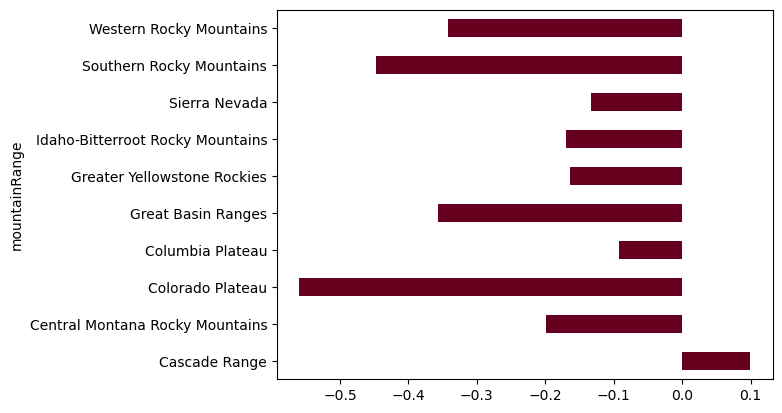

In [23]:
snotel_gf_projected_trends.plot.barh(cmap='RdBu')

In [24]:
dataset = 'GMBA_Inventory_v2.0_standard_300.zip'
url = f'https://data.earthenv.org/mountains/standard/{dataset}'
gf_gmba = gpd.read_file('zip+'+url)
mountains_gf = gf_gmba[gf_gmba.MapName.isin(snotel_gf_projected_trends.index)].sort_values('MapName')

In [25]:
mountains_gf['doy_max_swe_trend'] = snotel_gf_projected_trends.values

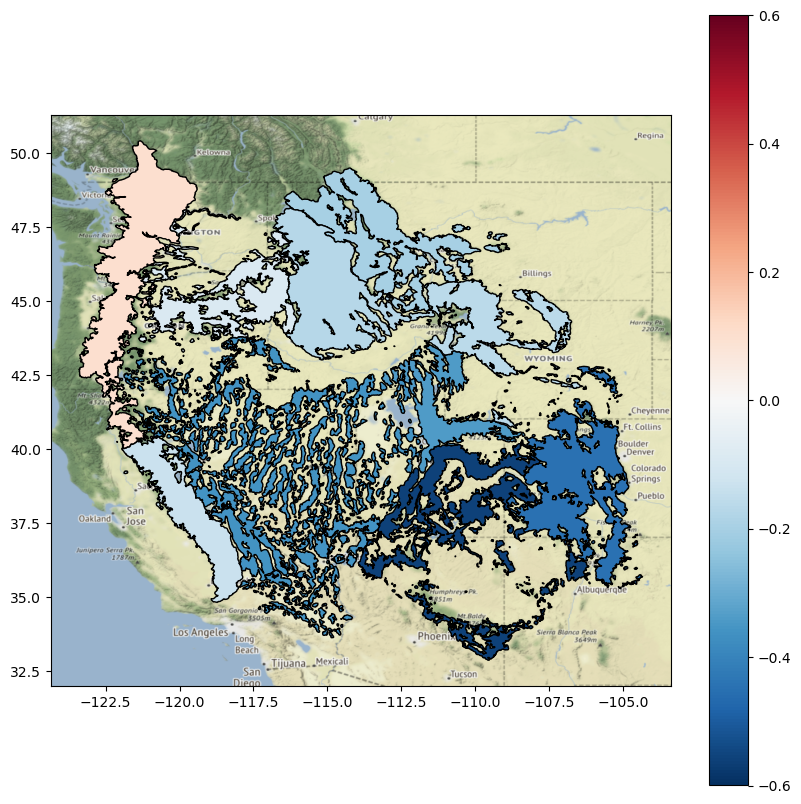

In [26]:
f,ax=plt.subplots(figsize=(10,10))
mountains_gf.plot(ax=ax,vmin=-0.6,vmax=0.6,column='doy_max_swe_trend',cmap='RdBu_r',legend=True,edgecolor='k')
ctx.add_basemap(ax=ax, crs=mountains_gf.crs, source=ctx.providers.Stamen.Terrain, attribution=False)

In [27]:
tooltip_list = ['code','name','elevation_m','mean_doy_max_swe','median_doy_max_swe','std_doy_max_swe','doy_max_swe_trend']

In [28]:
snotel_gf_projected.drop(['beginDate','endDate','isActive'],axis=1).explore(column='doy_max_swe_trend',cmap='RdBu_r',tooltip=tooltip_list,vmin=-1,vmax=1)

In [29]:
snotel_gf_projected.corr()

,elevation_m,latitude,longitude,median_doy_max_swe,mean_doy_max_swe,std_doy_max_swe,median_max_swe,mean_max_swe,std_max_swe,doy_max_swe_trend,max_swe_trend
elevation_m,1.000000,-0.791792,0.829118,0.221179,0.227044,-0.098966,-0.080968,-0.060103,-0.172120,-0.404895,-0.083682
latitude,-0.791792,1.000000,-0.847944,0.302750,0.301319,0.057537,0.145998,0.125843,0.081350,0.344293,0.166538
longitude,0.829118,-0.847944,1.000000,0.009590,0.003401,-0.096302,-0.084921,-0.074717,-0.197370,-0.278183,0.049983
median_doy_max_swe,0.221179,0.302750,0.009590,1.000000,0.973992,-0.049414,0.481638,0.482274,0.253501,0.075772,0.102720
mean_doy_max_swe,0.227044,0.301319,0.003401,0.973992,1.000000,0.115631,0.459503,0.453677,0.253809,0.010221,0.110608
std_doy_max_swe,-0.098966,0.057537,-0.096302,-0.049414,0.115631,1.000000,-0.041913,-0.076398,0.128617,-0.618262,0.146137
median_max_swe,-0.080968,0.145998,-0.084921,0.481638,0.459503,-0.041913,1.000000,0.993991,0.873236,0.233072,0.033450
mean_max_swe,-0.060103,0.125843,-0.074717,0.482274,0.453677,-0.076398,0.993991,1.000000,0.875423,0.227979,0.006627
std_max_swe,-0.172120,0.081350,-0.197370,0.253501,0.253809,0.128617,0.873236,0.875423,1.000000,0.178789,-0.113926
doy_max_swe_trend,-0.404895,0.344293,-0.278183,0.075772,0.010221,-0.618262,0.233072,0.227979,0.178789,1.000000,0.119856


Text(0.5, 1.0, 'SNOTEL Date of Max SWE Trend vs Elevation')

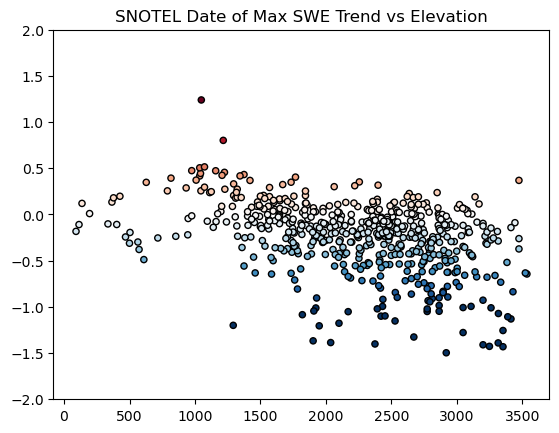

In [30]:
f,ax=plt.subplots()
ax.scatter(snotel_gf_projected['elevation_m'],snotel_gf_projected['doy_max_swe_trend'],c=snotel_gf_projected['doy_max_swe_trend'],edgecolor='k',cmap='RdBu_r',s=20,vmin=-1,vmax=1)
ax.set_ylim([-2,2])
ax.set_title('SNOTEL Date of Max SWE Trend vs Elevation')

Text(0.5, 1.0, 'SNOTEL Date of Max SWE Trend vs Latitude')

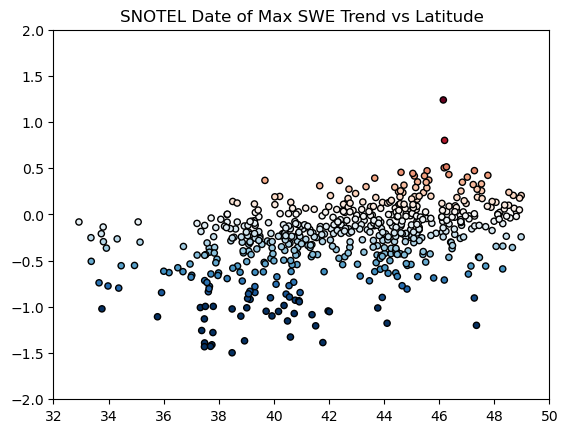

In [31]:
f,ax=plt.subplots()
ax.scatter(snotel_gf_projected['latitude'],snotel_gf_projected['doy_max_swe_trend'],c=snotel_gf_projected['doy_max_swe_trend'],edgecolor='k',cmap='RdBu_r',s=20,vmin=-1,vmax=1)
ax.set_ylim([-2,2])
ax.set_xlim([32,50])
ax.set_title('SNOTEL Date of Max SWE Trend vs Latitude')

Text(0.5, 1.0, 'SNOTEL Date of Max SWE Trend vs Longitude')

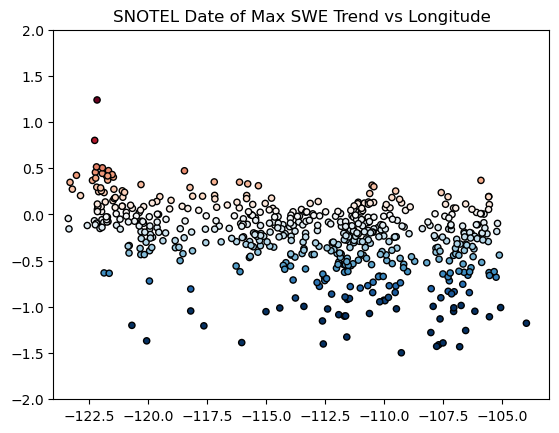

In [32]:
f,ax=plt.subplots()
ax.scatter(snotel_gf_projected['longitude'],snotel_gf_projected['doy_max_swe_trend'],c=snotel_gf_projected['doy_max_swe_trend'],edgecolor='k',cmap='RdBu_r',s=20,vmin=-1,vmax=1)
ax.set_ylim([-2,2])
ax.set_xlim([-124,-103])
ax.set_title('SNOTEL Date of Max SWE Trend vs Longitude')

/srv/conda/envs/notebook/lib/python3.10/site-packages/numpy/lib/histograms.py:837: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/srv/conda/envs/notebook/lib/python3.10/site-packages/numpy/lib/histograms.py:838: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


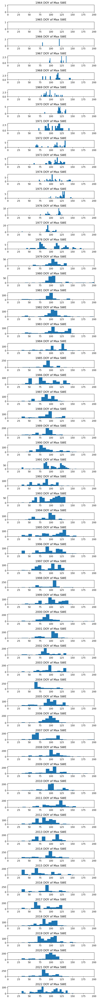

In [33]:
f,ax=plt.subplots(len(years),1,figsize=(6,60))
for year,axs in zip(years,ax.ravel()):
    axs.hist(snotel_gf_projected[f'doy_max_swe_{year}'],bins=30)
    axs.set_title(f'{year} DOY of Max SWE')
    axs.set_xlim([0,200])
    #axs.set_ylim([0,350])
plt.tight_layout()

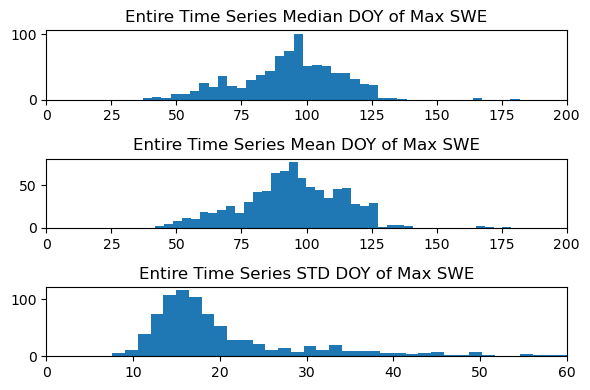

In [34]:
f,ax=plt.subplots(3,1,figsize=(6,4))
ax[0].hist(snotel_gf_projected[f'median_doy_max_swe'],bins=40)
ax[0].set_title(f'Entire Time Series Median DOY of Max SWE')
ax[0].set_xlim([0,200])
ax[1].hist(snotel_gf_projected[f'mean_doy_max_swe'],bins=40)
ax[1].set_title(f'Entire Time Series Mean DOY of Max SWE')
ax[1].set_xlim([0,200])
ax[2].hist(snotel_gf_projected[f'std_doy_max_swe'],bins=60)
ax[2].set_title(f'Entire Time Series STD DOY of Max SWE')
ax[2].set_xlim([0,60])
plt.tight_layout()

In [35]:
snotel_gf_projected.describe()

,elevation_m,latitude,longitude,median_doy_max_swe,mean_doy_max_swe,std_doy_max_swe,median_max_swe,mean_max_swe,std_max_swe,doy_max_swe_trend,max_swe_trend
count,868.000000,868.000000,868.000000,834.000000,834.000000,834.000000,834.000000,834.000000,834.000000,569.000000,569.000000
mean,2173.990565,43.661984,-115.685892,93.489209,94.394335,20.988580,18.197122,18.780975,6.686278,-0.242060,-0.059566
std,779.290799,6.391633,10.438505,19.284700,19.499760,10.767816,12.269279,12.066590,4.343919,0.375529,0.125089
min,7.620000,32.924011,-164.292572,37.000000,41.750000,7.620461,0.000000,0.000000,0.000000,-1.496678,-0.585775
25%,1699.260040,39.591045,-119.563408,83.000000,82.600379,14.655831,10.250000,10.699513,3.812701,-0.425370,-0.118552
50%,2345.283569,42.619249,-112.735241,95.000000,94.768360,17.321223,14.975000,15.719372,5.442706,-0.191395,-0.055998
75%,2750.057922,45.747646,-109.672152,106.500000,108.617483,23.056506,23.200000,24.129429,8.217312,-0.003403,0.007444
max,3541.775879,70.266663,-103.787582,182.000000,178.750000,95.782305,99.900000,85.560000,39.749624,1.239414,0.484028


In [36]:
snotel_doy_max_swe_gf.describe()

,doy_max_swe_1964,doy_max_swe_1965,doy_max_swe_1966,doy_max_swe_1967,doy_max_swe_1968,doy_max_swe_1969,doy_max_swe_1970,doy_max_swe_1971,doy_max_swe_1972,doy_max_swe_1973,...,doy_max_swe_2013,doy_max_swe_2014,doy_max_swe_2015,doy_max_swe_2016,doy_max_swe_2017,doy_max_swe_2018,doy_max_swe_2019,doy_max_swe_2020,doy_max_swe_2021,doy_max_swe_2022
count,1.0,1.0,3.000000,11.000000,18.000000,24.000000,25.000000,27.000000,33.000000,36.000000,...,798.000000,807.000000,819.000000,821.000000,826.000000,825.000000,831.000000,831.000000,833.000000,833.000000
mean,118.0,107.0,106.666664,120.181816,109.888885,97.666664,120.919998,107.111115,107.424240,110.472221,...,92.795738,90.936806,73.391945,84.129112,86.346245,92.504242,94.700363,92.974731,89.428574,92.774307
std,NaN,NaN,23.094009,15.426070,18.246317,13.659418,9.725053,16.525816,24.185518,14.867965,...,25.760342,26.355511,32.009094,29.139555,26.116323,19.446224,21.605631,22.592899,20.912807,27.818567
min,118.0,107.0,80.000000,96.000000,80.000000,77.000000,85.000000,71.000000,64.000000,60.000000,...,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
25%,118.0,107.0,100.000000,110.500000,98.250000,87.000000,118.000000,93.000000,92.000000,98.750000,...,69.000000,74.500000,57.000000,75.000000,67.000000,83.000000,77.000000,90.000000,85.000000,75.000000
50%,118.0,107.0,120.000000,124.000000,113.000000,96.500000,120.000000,111.000000,113.000000,113.000000,...,87.000000,96.000000,65.000000,90.000000,74.000000,95.000000,95.000000,97.000000,87.000000,92.000000
75%,118.0,107.0,120.000000,131.500000,117.000000,109.250000,122.000000,118.500000,130.000000,121.000000,...,113.000000,99.000000,101.500000,93.000000,110.000000,108.000000,107.000000,108.000000,102.000000,114.000000
max,118.0,107.0,120.000000,136.000000,146.000000,127.000000,135.000000,143.000000,134.000000,133.000000,...,268.000000,268.000000,261.000000,268.000000,250.000000,240.000000,255.000000,270.000000,268.000000,171.000000


In [37]:
column_names = {list(snotel_doy_max_swe_gf.columns)[i]: years[i] for i in range(len(years))}

In [38]:
flattened = pd.melt(snotel_doy_max_swe_gf.rename(columns=column_names).T.reset_index().rename(columns={'index':'year'}),id_vars='year')

In [39]:
flattened = flattened.dropna()

In [40]:
slope,intercept = np.polyfit(flattened.year,flattened.value,1)

Text(0.5, 1.0, 'SNOTEL DOY of Max SWE (all stations)')

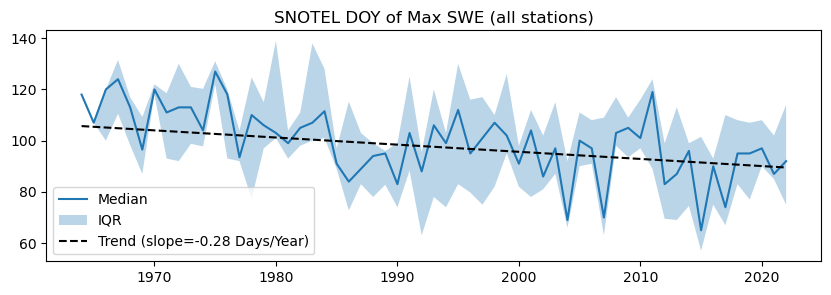

In [41]:
f,ax=plt.subplots(figsize=(10,3))
#ax.scatter(x=years,y=snotel_doy_max_swe_gf.describe().loc['50%'])
#ax.scatter(x=years,y=snotel_doy_max_swe_gf.describe().loc['25%'])
#ax.scatter(x=years,y=snotel_doy_max_swe_gf.describe().loc['75%'])
ax.plot(years,snotel_doy_max_swe_gf.describe().loc['50%'],label='Median')
ax.fill_between(years,snotel_doy_max_swe_gf.describe().loc['25%'],snotel_doy_max_swe_gf.describe().loc['75%'],alpha=0.3,label='IQR')
ax.plot(years,np.array(years)*slope+intercept,'k--',label=f'Trend (slope={slope:.2f} Days/Year)')
ax.legend()
ax.set_title('SNOTEL DOY of Max SWE (all stations)')

#.plot(ax=ax)
#snotel_doy_max_swe_gf.describe().loc['mean'].plot(ax=ax)

Text(0, 0.5, 'Number of active stations')

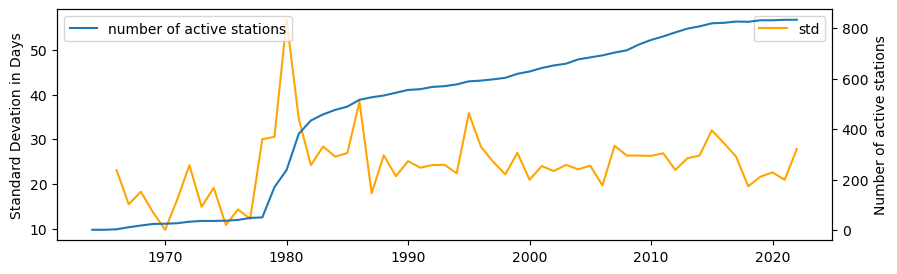

In [42]:
f,ax=plt.subplots(figsize=(10,3))
count_ax = ax.twinx()
count_ax.plot(years,snotel_doy_max_swe_gf.describe().loc['count'],label='number of active stations')
ax.plot(years,snotel_doy_max_swe_gf.describe().loc['std'],label='std',color='orange')
ax.legend()
count_ax.legend()
ax.set_ylabel('Standard Devation in Days')
count_ax.set_ylabel('Number of active stations')

In [43]:
import statsmodels.api as sm
X2 = sm.add_constant(flattened.year)
mod = sm.OLS(flattened.value,X2)
fii = mod.fit()
p_values = fii.summary2()

In [44]:
p_values

<class 'statsmodels.iolib.summary2.Summary'>
"""
                  Results: Ordinary least squares
====================================================================
Model:              OLS              Adj. R-squared:     0.016      
Dependent Variable: value            AIC:                267372.8229
Date:               2023-03-09 22:16 BIC:                267389.3236
No. Observations:   28292            Log-Likelihood:     -1.3368e+05
Df Model:           1                F-statistic:        465.3      
Df Residuals:       28290            Prob (F-statistic): 2.21e-102  
R-squared:          0.016            Scale:              744.36     
----------------------------------------------------------------------
          Coef.     Std.Err.      t       P>|t|     [0.025     0.975] 
----------------------------------------------------------------------
const    653.4088    25.8958    25.2322   0.0000   602.6518   704.1658
year      -0.2789     0.0129   -21.5719   0.0000    -0.3042    -0.2535
--------------------------------------------------------------------
Omnibus:              6543.937      Durbin-Watson:         1.123    
Prob(Omnibus):        0.000         Jarque-Bera (JB):      46433.560
Skew:                 0.929         Prob(JB):              0.000    
Kurtosis:             8.995         Condition No.:         319795   
====================================================================
* The condition number is large (3e+05). This might indicate
strong multicollinearity or other numerical problems.
"""

# Now let's look at magnitudes of SWE

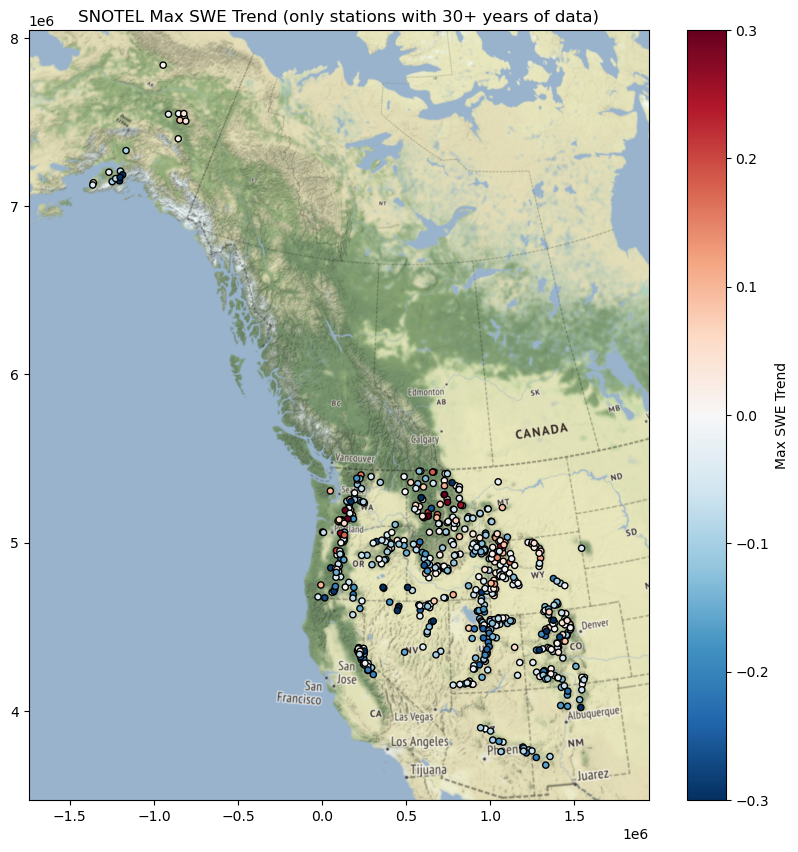

In [45]:
f,ax=plt.subplots(figsize=(10,10))
snotel_gf_projected =snotel_gf.to_crs('EPSG:32611')
snotel_gf_projected.plot(column='max_swe_trend',ax=ax,legend=True,cmap='RdBu_r',edgecolor='k',markersize=20,vmin=-0.3,vmax=0.3,legend_kwds={'label':'Max SWE Trend'})
ax.axis('equal')
ax.set_title('SNOTEL Max SWE Trend (only stations with 30+ years of data)')
ctx.add_basemap(ax=ax, crs=snotel_gf_projected.crs, source=ctx.providers.Stamen.Terrain, attribution=False)

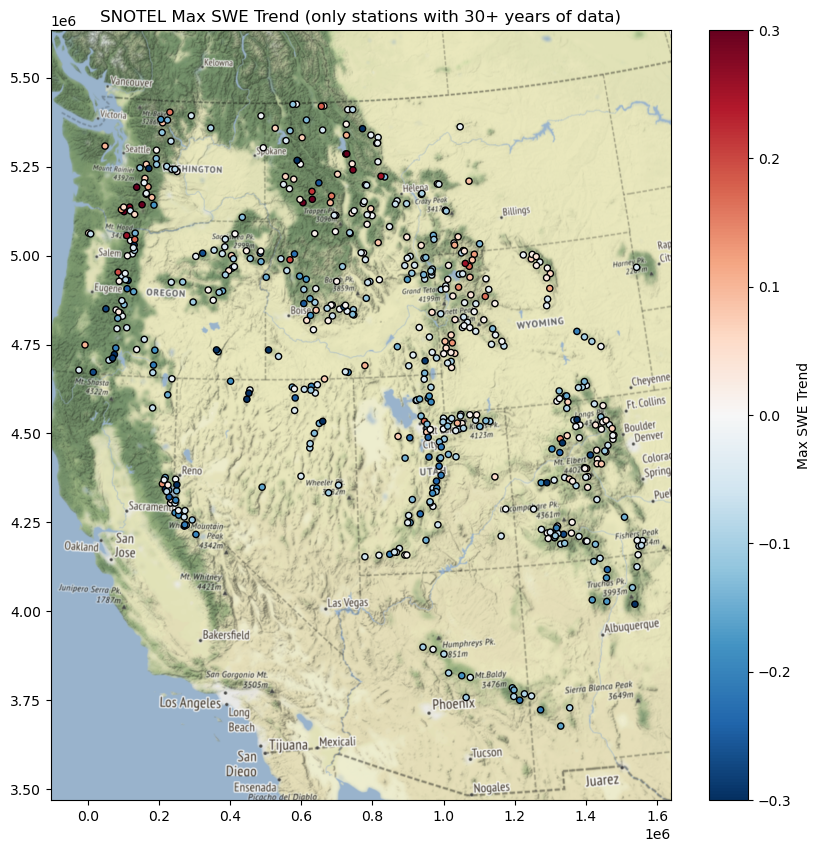

In [46]:
f,ax=plt.subplots(figsize=(10,10))
snotel_gf_projected[snotel_gf_projected.state!='Alaska'].plot(column='max_swe_trend',ax=ax,legend=True,cmap='RdBu_r',edgecolor='k',markersize=20,vmin=-0.3,vmax=0.3,legend_kwds={'label':'Max SWE Trend'})
ax.axis('equal')
ax.set_title('SNOTEL Max SWE Trend (only stations with 30+ years of data)')
ctx.add_basemap(ax=ax, crs=snotel_gf_projected.crs, source=ctx.providers.Stamen.Terrain, attribution=False)

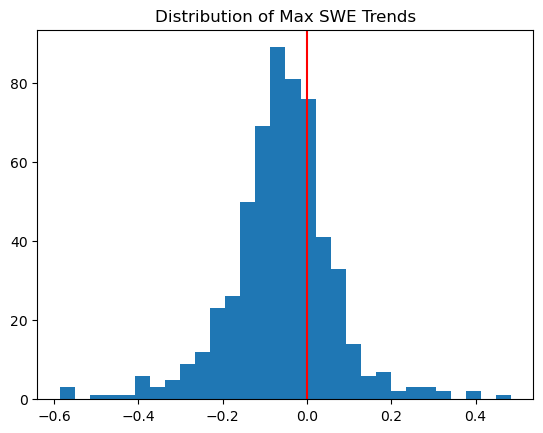

In [47]:
f,ax=plt.subplots()
ax.hist(snotel_gf_projected['max_swe_trend'],bins=30)
ax.set_title('Distribution of Max SWE Trends')
ax.axvline(x=0,color='red')

In [48]:
snotel_gf_projected_trends_mag = snotel_gf_projected.groupby('mountainRange').mean()['max_swe_trend'][snotel_gf_projected.groupby('mountainRange')['max_swe_trend'].count()>7]

<AxesSubplot:ylabel='mountainRange'>

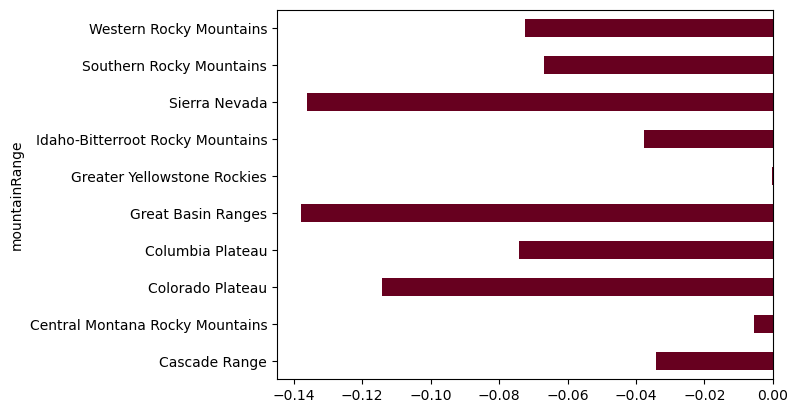

In [49]:
snotel_gf_projected_trends_mag.plot.barh(cmap='RdBu')

In [50]:
mountains_gf['max_swe_trend'] = snotel_gf_projected_trends_mag.values

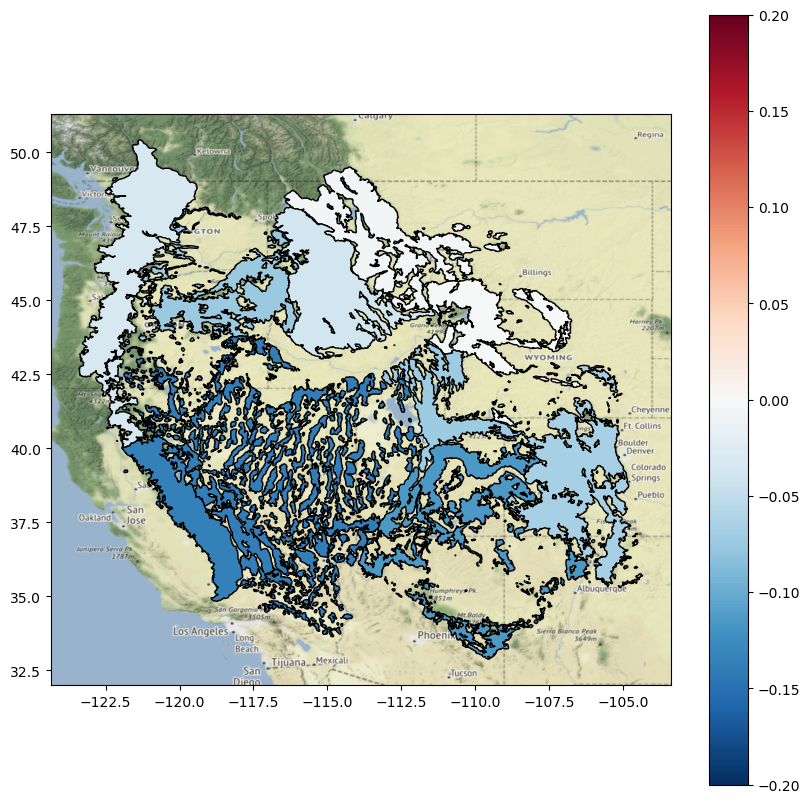

In [51]:
f,ax=plt.subplots(figsize=(10,10))
mountains_gf.plot(ax=ax,vmin=-0.2,vmax=0.2,column='max_swe_trend',cmap='RdBu_r',legend=True,edgecolor='k')
ctx.add_basemap(ax=ax, crs=mountains_gf.crs, source=ctx.providers.Stamen.Terrain, attribution=False)

Text(0.5, 1.0, 'SNOTEL Max SWE Trend vs Elevation')

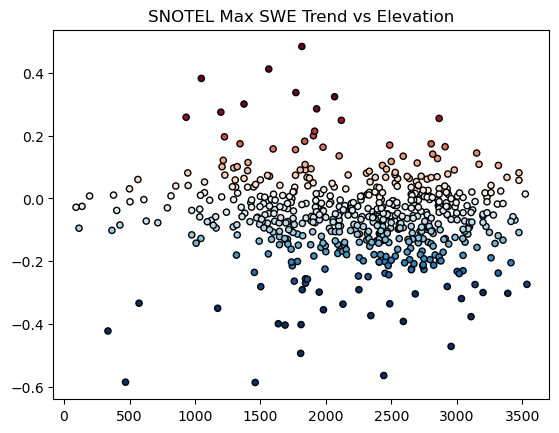

In [52]:
f,ax=plt.subplots()
ax.scatter(snotel_gf_projected['elevation_m'],snotel_gf_projected['max_swe_trend'],c=snotel_gf_projected['max_swe_trend'],edgecolor='k',cmap='RdBu_r',s=20,vmin=-0.3,vmax=0.3)
#ax.set_ylim([-2,2])
ax.set_title('SNOTEL Max SWE Trend vs Elevation')

Text(0.5, 1.0, 'SNOTEL Max SWE Trend vs Latitude')

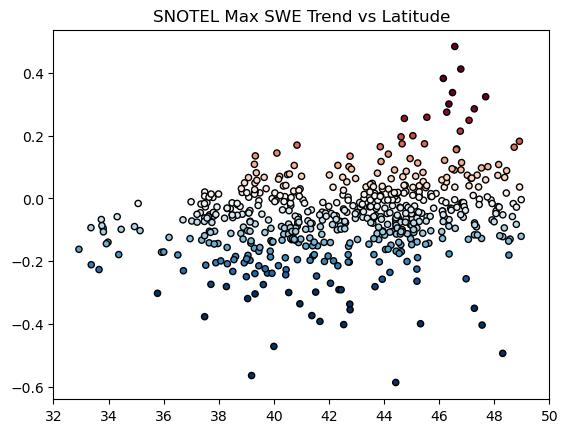

In [53]:
f,ax=plt.subplots()
ax.scatter(snotel_gf_projected['latitude'],snotel_gf_projected['max_swe_trend'],c=snotel_gf_projected['max_swe_trend'],edgecolor='k',cmap='RdBu_r',s=20,vmin=-0.3,vmax=0.3)
#ax.set_ylim([-2,2])
ax.set_xlim([32,50])
ax.set_title('SNOTEL Max SWE Trend vs Latitude')

Text(0.5, 1.0, 'SNOTEL Max SWE Trend vs Longitude')

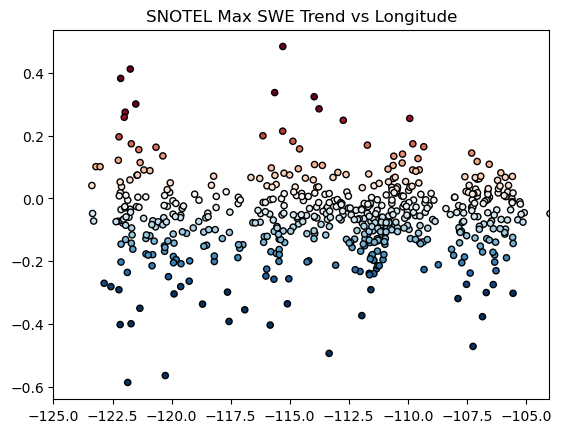

In [54]:
f,ax=plt.subplots()
ax.scatter(snotel_gf_projected['longitude'],snotel_gf_projected['max_swe_trend'],c=snotel_gf_projected['max_swe_trend'],edgecolor='k',cmap='RdBu_r',s=20,vmin=-0.3,vmax=0.3)
#ax.set_ylim([-2,2])
ax.set_xlim([-125,-104])
ax.set_title('SNOTEL Max SWE Trend vs Longitude')

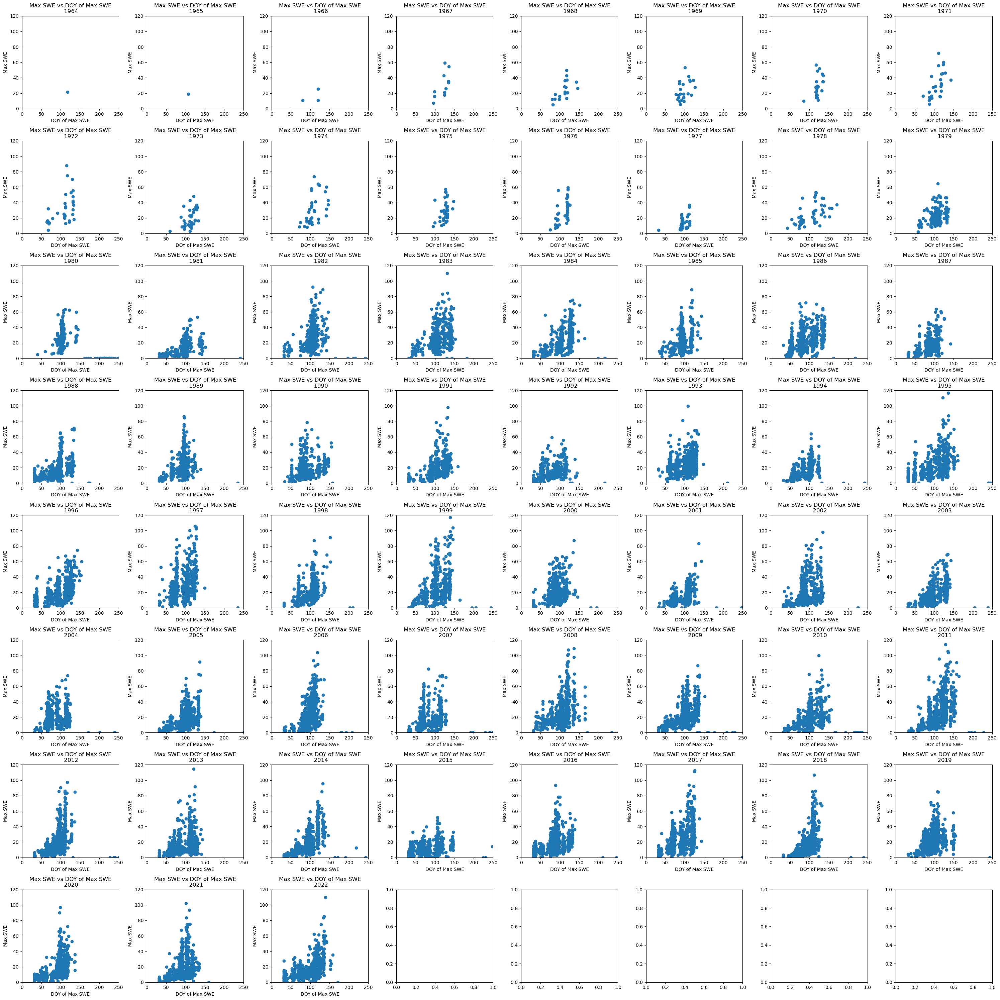

In [67]:
f,ax=plt.subplots(8,8, figsize=(30,30))

for year,axs in zip(years,ax.ravel()):
    axs.scatter(snotel_gf_projected[f'doy_max_swe_{year}'],snotel_gf_projected[f'max_swe_{year}'])
    axs.set_title(f'Max SWE vs DOY of Max SWE\n {year}')
    axs.set_xlabel('DOY of Max SWE')
    axs.set_ylabel('Max SWE')
    axs.set_xlim([0,250])
    axs.set_ylim([0,120])
plt.tight_layout()